# Нахождение устойчивых словосочетаний (биграммм) в рассказах Андрея Платонова

In [ ]:
# Установка библиотеки spaCy
!pip install -U spacy
!python -m spacy download ru_core_news_sm

In [1]:
import spacy
nlp = spacy.load("ru_core_news_sm")

In [ ]:
# Проверка версий библиотек
#!pip show spacy
#!pip show pymorphy2

## Перевод рассказов А. Платонова из формата html в txt

In [ ]:
# Установка библиотеки для парсинга сайтов
!pip install beautifulsoup4

**Алгоритм:**     
    1. Обход в цикле всех html-страниц в папке  
    2. Чтение текста, расположенного в теге <article> (название, сам рассказ)  
    3. Очистка текстов от неразрывных пробелов  
    4. Запись текста в новый файл, закрытие файла

In [ ]:
docs ='D:\Платонов HTML'
from bs4 import BeautifulSoup
import os

def get_filename(path):
    return [i.path for i in os.scandir(path) if i.is_file()]

files = get_filename(docs)
# Счётчик обработанных файлов
i = 0

for filepath in files:
    with open(filepath, 'r', encoding="utf8") as file:
        s = file.read()
        soup = BeautifulSoup(s)
        texts = soup.find_all(text=True)
        # Замена неразрывных пробелов в тексте
        for t in texts:
            newtext = t.replace("&nbsp;", '')
            t.replace_with(newtext)
        # Переменная для сохранения текста
        text = ''
        article = soup.find('article')
        # Если в hmtl-странице есть тег <article> (Это рассказ, а не лишняя страница)
        if article is not None:
            i += 1
            new_file = open(f"D:/Platonov txt/{i}.txt", "w", encoding="utf8")
            print(i)
            for p in article:
                text = str(p.get_text())
                text = text.replace('\xa0', ' ')
                if (text != ' '):
                    new_file.write(text + '\n')
            new_file.close()

## Предварительная обработка рассказов Андрея Платонова

In [ ]:
# Установка библиотеки для поиска нормальной формы слов
!pip install pymorphy2

In [3]:
import pymorphy2
# Загрузка класса для морфологического анализа
morph = pymorphy2.MorphAnalyzer()

In [ ]:
# Установка библиотеки для обработки текстов
!pip install nltk

In [4]:
# Объединение рассказов в единый файл
docs ='D:\Platonov txt'

def get_filename(path):
    return [i.path for i in os.scandir(path) if i.is_file()]

files=get_filename(docs)
outfile = open("D:/all_texts.txt", "w", encoding="utf8")
for filepath in files:
    with open(filepath, 'r', encoding="utf8") as file:
        outfile.write(file.read())
        file.close()

Извлечение биграмм из рассказов

In [5]:
import pymorphy2
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.collocations import *

# Создание правила для распознавания слов через дефис как 1 токен
tokenizer = RegexpTokenizer(r'\w+-?\w+')
morph = pymorphy2.MorphAnalyzer()

file_to_read = open("D:/all_texts.txt", "r", encoding="utf8")
text = file_to_read.read()
# Перевод в нижний регистр и только потом поиск словосочетаний
text = text.lower()
text = tokenizer.tokenize(text)
# Поиск нормальной формы слова для каждого токена
pymorphy2_lemmas = ([morph.parse(token)[0].normal_form for token in text])
lemmas = ' '.join(map(str, pymorphy2_lemmas))     
file_to_read.close()

bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokenizer.tokenize(lemmas))
# Не рассматриваем как кандидаты на ключевые словосочетания токены длиной < 3 и стоп-слова из словаря
ignored_words = nltk.corpus.stopwords.words('russian')
finder.apply_word_filter(lambda w: len(w) < 3 or w.lower() in ignored_words)

In [6]:
# 10 наиболее частотных биграмм, мера log-likelihood
finder.nbest(bigram_measures.likelihood_ratio, 10)

[('яков', 'саввович'),
 ('пётр', 'евсеевич'),
 ('евдокия', 'гаврилович'),
 ('всё', 'равно'),
 ('сергей', 'семёнович'),
 ('василий', 'ефремович'),
 ('фёдор', 'фёдорович'),
 ('друг', 'друг'),
 ('авдотья', 'захарович'),
 ('демьян', 'фомич')]

In [7]:
# 10 наиболее частотных биграмм, мера PMI
finder.nbest(bigram_measures.pmi, 10)

[('10-летний', 'юбилей'),
 ('118', 'ки-лометр'),
 ('1910', 'епи-фаньский'),
 ('224', 'неусыпно'),
 ('antisexus', 'долженствовать'),
 ('honoris', 'causa'),
 ('industriale', 'internationale'),
 ('internationale', 'revu'),
 ('xix', 'столетие'),
 ('автоматизировать', 'нормализировать')]

In [8]:
# 10 наиболее частотных биграмм, мера хи-квадрат
finder.nbest(bigram_measures.chi_sq, 10)

[('10-летний', 'юбилей'),
 ('118', 'ки-лометр'),
 ('1910', 'епи-фаньский'),
 ('224', 'неусыпно'),
 ('antisexus', 'долженствовать'),
 ('honoris', 'causa'),
 ('industriale', 'internationale'),
 ('internationale', 'revu'),
 ('xix', 'столетие'),
 ('автоматизировать', 'нормализировать')]

### Мера log-likelihood

In [9]:
bigramms_log = finder.score_ngrams(bigram_measures.likelihood_ratio)
bigramms_log

[(('яков', 'саввович'), 1101.9819931687896),
 (('пётр', 'евсеевич'), 991.2713095170261),
 (('евдокия', 'гаврилович'), 941.4386500470068),
 (('всё', 'равно'), 895.2978061991519),
 (('сергей', 'семёнович'), 850.5787936702714),
 (('василий', 'ефремович'), 817.6614266293515),
 (('фёдор', 'фёдорович'), 782.6683782027026),
 (('друг', 'друг'), 756.8441291041913),
 (('авдотья', 'захарович'), 582.0570479984025),
 (('демьян', 'фомич'), 561.6145699028816),
 (('мария', 'никифорович'), 559.5877759232598),
 (('пётр', 'савельич'), 528.2560658637723),
 (('старший', 'лейтенант'), 502.89999997105764),
 (('матвей', 'иванович'), 458.81130094051946),
 (('челюсть', 'дракон'), 441.1778297080008),
 (('левый', 'фланг'), 441.0563426633266),
 (('анна', 'гаврилович'), 432.9743110462105),
 (('населить', 'пункт'), 432.07238074416097),
 (('алексей', 'алексеевич'), 416.0582282154002),
 (('начальник', 'станция'), 404.65354891583735),
 (('сергей', 'леонтиевич'), 393.3967643278847),
 (('аполлинарий', 'николаевич'), 374.

### Мера Pointwise Mutual Information

In [10]:
bigramms_pmi = finder.score_ngrams(bigram_measures.pmi)
bigramms_pmi

[(('10-летний', 'юбилей'), 18.262388523751017),
 (('118', 'ки-лометр'), 18.262388523751017),
 (('1910', 'епи-фаньский'), 18.262388523751017),
 (('224', 'неусыпно'), 18.262388523751017),
 (('antisexus', 'долженствовать'), 18.262388523751017),
 (('honoris', 'causa'), 18.262388523751017),
 (('industriale', 'internationale'), 18.262388523751017),
 (('internationale', 'revu'), 18.262388523751017),
 (('xix', 'столетие'), 18.262388523751017),
 (('автоматизировать', 'нормализировать'), 18.262388523751017),
 (('агар', 'лал'), 18.262388523751017),
 (('агроминимум', 'женщина-коллективистка'), 18.262388523751017),
 (('адм', 'фин'), 18.262388523751017),
 (('александрия', 'бангкок'), 18.262388523751017),
 (('анатоль', 'франс'), 18.262388523751017),
 (('англо-евро', 'американский'), 18.262388523751017),
 (('анеля', 'дворкин'), 18.262388523751017),
 (('антропосом', 'человекоподобный'), 18.262388523751017),
 (('арбузный', 'подмочка'), 18.262388523751017),
 (('арчак', 'срочно'), 18.262388523751017),
 ((

In [ ]:
## Подсчет частоты биграмм
from collections import Counter

tokenizer = RegexpTokenizer(r'\w+-?\w+')

with open("D:/Results/all_lemmas.txt", "r") as file:
    text = file.read()
    text = text.lower()
    words = tokenizer.tokenize(text)

# Генерируем биграммы
bigrams = nltk.bigrams(words)

# Считаем частоту каждой биграммы
frequency = Counter(bigrams)

# Записываем в файл и печатаем результат
with open('D:/bigramms_count.txt', 'w') as f:
    for bigram, count in frequency.items():
        f.write(f'{bigram}\t{count}\n')
        print(bigram, count)

Поиск предложений, в которых употреблялись слова  «вещество» / «пространство»

In [ ]:
import pymorphy2
import spacy 

nlp = spacy.load("ru_core_news_sm")
file = open("D:/all_texts.txt", "r", encoding="utf8")

text = file.read()
text = text.lower()
nlp.max_length = len(text) + 100
doc = nlp(text)

# Правило для токенизации слов через дефис
suffixes = tuple(nlp.Defaults.suffixes) + (r'''\w+-\w+''',)
suffix_regex = spacy.util.compile_suffix_regex(suffixes)
nlp.tokenizer.suffix_search = suffix_regex.search

morph = pymorphy2.MorphAnalyzer()        

for sent in doc.sents:
    try:
        for token in sent:
            # Если в предложении встретилось слово с нормальной формой «вещество»
            if morph.parse(token.text)[0].normal_form == 'вещество':
                # Вывод предложения на печать
                print(sent)
                # Если слово встречается более 1 раза, не печатаем приложение второй раз
                raise StopIteration
    except StopIteration:
        pass

## Облако слов

Размер слов в облаке зависит от статистики, полученной по мере Log-Likelihood

In [ ]:
# Установка библиотеки 
!pip install wordcloud

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

### Облако всех найденных слов для «вещество»

74 слова

In [14]:
with open(r'D:\Results\v_with_log.txt', 'r', encoding='utf8') as file:
    lines = file.readlines()

# Словарь для хранения слов и статистики log-likelihood
v_words = {}

for line in lines:
    word, number = line.strip().split()
    v_words[word] = float(number)

file.close()

In [ ]:
wordcloud = WordCloud(background_color='white', width=3000, height=1200)
wordcloud.generate_from_frequencies(frequencies=v_words)

plt.figure(figsize=(16,12), dpi=1000)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Облако после ручной проверки

46 слов

In [16]:
with open(r'D:\Results\v_with_log_clean.txt', 'r', encoding='utf8') as file:
    lines = file.readlines()

# Словарь для хранения слов и статистики log-likelihood
v_words_clean = {}

for line in lines:
    word, number = line.strip().split()
    v_words_clean[word] = float(number)

file.close()

In [17]:
wordcloud = WordCloud(background_color='white', width=3000, height=1200)
wordcloud.generate_from_frequencies(frequencies=v_words_clean)

plt.figure(figsize=(16,12), dpi=1000)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Облако всех найденных слов для «пространство»

150 слов

In [18]:
with open(r'D:\Results\p_with_log.txt', 'r', encoding='utf8') as file:
    lines = file.readlines()

# Словарь для хранения слов и статистики log-likelihood
p_words = {}

for line in lines:
    word, number = line.strip().split()
    p_words[word] = float(number)

file.close()

with open(r'D:\Results\p_with_log_clean.txt', 'r', encoding='utf8') as file:
    lines = file.readlines()

# Словарь для хранения слов и статистики log-likelihood
p_words_clean = {}

for line in lines:
    word, number = line.strip().split()
    p_words_clean[word] = float(number)

file.close()

In [ ]:
wordcloud = WordCloud(background_color='white', width=3000, height=1200)
wordcloud.generate_from_frequencies(frequencies=p_words)

plt.figure(figsize=(16,12), dpi=1000)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Облако после ручной проверки

88 слов

In [20]:
wordcloud = WordCloud(background_color='white', width=3000, height=1200)
wordcloud.generate_from_frequencies(frequencies=p_words_clean)

plt.figure(figsize=(16,12), dpi=1000)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Подсчет частей речи

### Для биграмм со словом «вещество»

In [33]:
file = open(f"D:/Results/v_empty_bigramms.txt", "r", encoding="utf8")
text = file.read()
text = text.replace('\n', ' ')
doc = nlp(text)

# Подсчет частей речи
pos_counts = {}
for token in doc:
    pos = token.pos_
    if pos in pos_counts:
        pos_counts[pos] += 1
    else:
        pos_counts[pos] = 1
# Сортировка по количеству употреблений (важно, чтобы еще и части речи также соотносились)
pos_counts = dict(sorted(pos_counts.items(), key=lambda x: x[1], reverse=True))
print(pos_counts)

{'VERB': 23, 'ADJ': 22, 'NOUN': 19, 'ADV': 4, 'PRON': 3, 'PROPN': 3}


In [34]:
file = open(f"D:/Results/v_clean_cloud.txt", "r", encoding="utf8")
text = file.read()
text = text.replace('\n', ' ')
doc = nlp(text)

# Подсчет частей речи
pos_counts_clean = {}
for token in doc:
    pos = token.pos_
    if pos in pos_counts_clean:
        pos_counts_clean[pos] += 1
    else:
        pos_counts_clean[pos] = 1

pos_counts_clean["PRON"] = 0
pos_counts_clean["PROPN"]= 0
# Сортировка по количеству употреблений
pos_counts_clean = dict(sorted(pos_counts_clean.items(), key=lambda x: x[1], reverse=True))
print(pos_counts_clean)

{'VERB': 18, 'ADJ': 16, 'NOUN': 10, 'ADV': 2, 'PRON': 0, 'PROPN': 0}


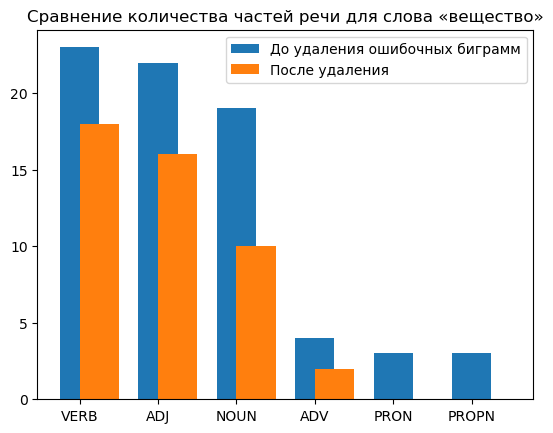

In [35]:
import matplotlib.pyplot as plt

keys = list(pos_counts.keys())
values1 = list(pos_counts.values())
values2 = list(pos_counts_clean.values())

plt.title("Сравнение количества частей речи для слова «вещество»")
plt.bar(keys, values1, width=0.5, align='center')
plt.bar(keys, values2, width=0.5, align='edge')
plt.legend(['До удаления ошибочных биграмм', 'После удаления'])
plt.show()

### Для биграмм со словом «пространство»

In [26]:
file = open(f"D:/Results/p_empty_bigramms.txt", "r", encoding="utf8")
text = file.read()
text = text.replace('\n', ' ')
doc = nlp(text)

# Подсчет частей речи
pos_counts = {}
for token in doc:
    pos = token.pos_
    if pos in pos_counts:
        pos_counts[pos] += 1
    else:
        pos_counts[pos] = 1
        
print(pos_counts)

{'ADJ': 48, 'NOUN': 41, 'VERB': 45, 'ADV': 9, 'ADP': 1, 'PROPN': 2, 'PART': 1, 'DET': 2, 'PRON': 1}


In [27]:
file = open(f"D:/Results/p_clean_cloud.txt", "r", encoding="utf8")
text = file.read()
text = text.replace('\n', ' ')
doc = nlp(text)

# Подсчет частей речи
pos_counts_clean = {}
for token in doc:
    pos = token.pos_
    if pos in pos_counts_clean:
        pos_counts_clean[pos] += 1
    else:
        pos_counts_clean[pos] = 1

print(pos_counts_clean)

{'ADJ': 40, 'NOUN': 28, 'VERB': 19, 'ADV': 1}


In [28]:
file = open(f"D:/Results/p_clean_cloud.txt", "r", encoding="utf8")
text = file.read()
text = text.replace('\n', ' ')
doc = nlp(text)

# Подсчет частей речи
pos_counts_clean = {}
for token in doc:
    pos = token.pos_
    if pos in pos_counts_clean:
        pos_counts_clean[pos] += 1
    else:
        pos_counts_clean[pos] = 1
pos_counts_clean["ADV"] = 0
pos_counts_clean["ADP"] = 0
pos_counts_clean["PROPN"] = 0
pos_counts_clean["PART"] = 0
pos_counts_clean["DET"] = 0
pos_counts_clean["PART"]= 0
pos_counts_clean["PRON"] = 0


print(pos_counts_clean)

{'ADJ': 40, 'NOUN': 28, 'VERB': 19, 'ADV': 0, 'ADP': 0, 'PROPN': 0, 'PART': 0, 'DET': 0, 'PRON': 0}


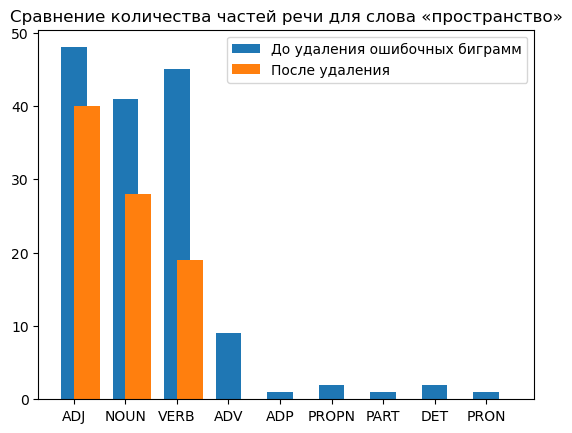

In [29]:
import matplotlib.pyplot as plt

keys = list(pos_counts.keys())
values1 = list(pos_counts.values())
values2 = list(pos_counts_clean.values())

plt.title("Сравнение количества частей речи для слова «пространство»") # заголовок
plt.bar(keys, values1, width=0.5, align='center')
plt.bar(keys, values2, width=0.5, align='edge')
plt.legend(['До удаления ошибочных биграмм', 'После удаления'])
plt.show()